# Future changes in radiation and wind

In [1]:
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import ttest_ind
import pandas as pd
import seaborn as sns
import glob

root_dir = "/g/data/eg3/nesp_bff/"
cities = ["Melbourne", "Darwin", "Cairns","Brisbane","Longreach","Mildura","Adelaide","Perth","Sydney","Canberra","Hobart"]
model = "ACCESS-CM2"

In [2]:
import glob, xarray as xr, numpy as np, matplotlib.pyplot as plt
from scipy.stats import ttest_ind

# --- Settings ---
models = ["ACCESS-ESM1-5", "ACCESS-CM2", "CESM2", "CMCC-ESM2","NorESM2-MM", "EC-Earth3", "MPI-ESM1-2-HR"]
vars_to_check = ["rsds", "rsdsdir", "sfcWind"]
dataset_colors = {"Obs": "black", "Rean": "gray",
                  "Hist": "tab:blue", "SSP126": "tab:green", "SSP370": "tab:red"}
alpha = 0.05

# --- Load single obs/reanalysis/historical reference (any model will do) ---
obs = xr.open_dataset(glob.glob(f"{root_dir}NatHERS/raw_data/{city}_*_NatHERS_1990-2015.nc")[0]).sel(time=slice("1990","2014"))
rean = xr.open_dataset(f"{root_dir}step1_raw_data_extraction/BARRA-R2/{city}_AUS-11_ERA5_historical_hres_BOM_BARRA-R2_v1_1hr_1985-2014.nc").sel(time=slice("1990","2014"))

# --- Combine multiple models for hist/ssp126/ssp370 ---
import xarray as xr
import numpy as np

def monthly_means_unified_calendar(ds):
    """Convert hourly data with any calendar to monthly means with a common datetime64 calendar."""
    
    # Convert to a standard calendar using xarray’s convert_calendar
    # This ensures all times become datetime64[ns]
    ds = xr.decode_cf(ds)
    if hasattr(ds.time.dt, "calendar"):
        ds = ds.convert_calendar("standard", use_cftime=False)

    # Convert to monthly means
    ds_monthly = ds.resample(time="1ME").mean()  # "1MS" = month start

    # Assign useful coordinates
    ds_monthly = ds_monthly.assign_coords(
        month=("time", ds_monthly["time"].dt.month.data),
        year=("time", ds_monthly["time"].dt.year.data)
    )

    return ds_monthly
    
def load_ensemble(period, ssp=None):
    files = []
    for m in models:
        if ssp is None:
            path = f"{root_dir}step1_raw_data_extraction/BARPA-R/1985_2014/{city}_AUS-15_{m}_historical_*_BOM_BARPA-R_v1-r1_1hr_1985-2014.nc"
        else:
            path = f"{root_dir}step1_raw_data_extraction/BARPA-R/2035_2064/{city}_AUS-15_{m}_{ssp}_*_BOM_BARPA-R_v1-r1_1hr_2035-2064.nc"
        ds = xr.open_dataset(glob.glob(path)[0]).sel(time=slice(*period))
        ds_mon = monthly_means_unified_calendar(ds)
        files.append(ds_mon[vars_to_check])
    return xr.concat(files, dim="model").assign_coords(model=models)

hist = load_ensemble(("1990","2014"))
ssp126 = load_ensemble(("2040-01-01","2064-12-30"), "ssp126")
ssp370 = load_ensemble(("2040-01-01","2064-12-30"), "ssp370")

# --- Daily and annual means ---
def to_annual(ds): return ds.resample(time="YE").mean()
obs_annual, rean_annual = to_annual(obs), to_annual(rean)
hist_annual, ssp126_annual, ssp370_annual = to_annual(hist), to_annual(ssp126), to_annual(ssp370)

# --- Ensemble mean and std ---
hist_mean = hist_annual.mean("model")
ssp126_mean = ssp126_annual.mean("model")
ssp370_mean = ssp370_annual.mean("model")
hist_std = hist_annual.std("model")
ssp126_std = ssp126_annual.std("model")
ssp370_std = ssp370_annual.std("model")

# --- Ensemble statistics ---
def ensemble_change(fut, hist):
    delta = fut.mean(("time","model")) - hist.mean(("time","model"))
    rel = 100 * delta / hist.mean(("time","model"))
    return delta, rel

delta_126, rel_126 = ensemble_change(ssp126_annual, hist_annual)
delta_370, rel_370 = ensemble_change(ssp370_annual, hist_annual)

print("\n=== Ensemble Mean Annual Changes ===")
for var in vars_to_check:
    # Flatten all ensemble members for t-test
    f126 = ssp126_annual[var].values.flatten()
    f370 = ssp370_annual[var].values.flatten()
    h = hist_annual[var].values.flatten()
    _, p126 = ttest_ind(f126, h, equal_var=False, nan_policy="omit")
    _, p370 = ttest_ind(f370, h, equal_var=False, nan_policy="omit")
    star126 = "*" if p126 < alpha else ""
    star370 = "*" if p370 < alpha else ""
    print(f"{var}: Δ126={float(delta_126[var]):.2f} ({float(rel_126[var]):.1f}%){star126}, "
          f"Δ370={float(delta_370[var]):.2f} ({float(rel_370[var]):.1f}%){star370}")

# --- Plotting ---
fig, axes = plt.subplots(2, len(vars_to_check), figsize=(6*len(vars_to_check), 10))

for i, var in enumerate(vars_to_check):
    # --- (1) Annual time series with ensemble shading ---
    ax = axes[0, i]
    ax.plot(obs_annual["time"].dt.year, obs_annual[var], color="black", linestyle="--", label="Obs")
    ax.plot(rean_annual["time"].dt.year, rean_annual[var], color="gray", label="Reanalysis")

    # Historical ensemble mean ± 1 std
    hist_mean = hist_annual[var].mean("model")
    hist_std = hist_annual[var].std("model")
    yrs_hist = hist_annual["time"].dt.year
    ax.plot(yrs_hist, hist_mean, color="tab:blue", label="Historical")
    ax.fill_between(yrs_hist, hist_mean - hist_std, hist_mean + hist_std,
                    color="tab:blue", alpha=0.2)

    # SSP ensembles
    for ssp_mean, ssp_std, col, lbl in [
        (ssp126_mean, ssp126_std, "tab:green", "SSP126"),
        (ssp370_mean, ssp370_std, "tab:red", "SSP370")
    ]:
        yrs = ssp_mean["time"].dt.year
        mean = ssp_mean[var]
        std = ssp_std[var]
        ax.plot(yrs, mean, color=col, label=lbl)
        ax.fill_between(yrs, mean - std, mean + std, color=col, alpha=0.2)

    ax.set_title(f"{var} — Annual Ensemble Trend")
    ax.set_ylabel("W/m²" if "rsds" in var else "m/s")
    ax.grid(True, ls="--", alpha=0.6)
    if i == 0:
        ax.legend()

    # --- (2) Annual boxplot (flatten ensembles) ---
    axb = axes[1, i]
    box_data = [
        obs_annual[var].values.flatten(),
        rean_annual[var].values.flatten(),
        hist_annual[var].values.flatten(),
        ssp126_annual[var].values.flatten(),
        ssp370_annual[var].values.flatten()
    ]
    boxes = axb.boxplot(box_data, tick_labels=["Obs","Rean","Hist","SSP126","SSP370"],
                        patch_artist=True)
    for patch, name in zip(boxes['boxes'], ["Obs","Rean","Hist","SSP126","SSP370"]):
        patch.set_facecolor(dataset_colors[name])
        patch.set_alpha(0.6)

    # significance asterisks
    y_hist = np.nanmax(hist_annual[var].values)
    for idx, (lbl, arr) in enumerate(zip(["SSP126","SSP370"], [box_data[3], box_data[4]]), start=4):
        _, p = ttest_ind(arr, box_data[2], equal_var=False, nan_policy="omit")
        if p < alpha:
            y = np.nanmax([np.nanmax(arr), y_hist])
            axb.text(idx+1, y*1.02, "*", color=dataset_colors[lbl],
                     ha="center", va="bottom", fontsize=14, fontweight="bold")

    axb.set_title(f"{var} — Ensemble Annual Distribution")
    axb.set_ylabel("W/m²" if "rsds" in var else "m/s")
    axb.grid(True, ls="--", alpha=0.6)

plt.suptitle(f"{city}: Radiation & Wind Speed — Multi-Model Ensemble Comparison",
             fontsize=16, fontweight="bold")
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


NameError: name 'city' is not defined



======================================= Melbourne =======================================

=== Ensemble Mean Annual Changes ===
rsds (W m-2): Δ126=3.21 (1.7%)*, Δ370=4.29 (2.3%)*
rsdsdir (W m-2): Δ126=5.11 (4.2%)*, Δ370=7.05 (5.8%)*
sfcWind (m s-1): Δ126=-0.01 (-0.3%), Δ370=-0.02 (-0.4%)
tas (K): Δ126=0.89 (0.3%)*, Δ370=1.44 (0.5%)*
huss (kg/kg): Δ126=0.00 (5.5%)*, Δ370=0.00 (8.6%)*
psl (Pa): Δ126=57.39 (0.1%)*, Δ370=66.15 (0.1%)*
clt (%): Δ126=-1.90 (-3.3%)*, Δ370=-3.23 (-5.6%)*

=== Ensemble Mean Seasonal Changes ===

rsds (W m-2):
  DJF: Δ126=3.78 (1.3%)*, Δ370=5.16 (1.8%)*
  MAM: Δ126=1.46 (1.0%), Δ370=2.02 (1.3%)
  JJA: Δ126=1.59 (1.7%), Δ370=2.20 (2.4%)*
  SON: Δ126=6.03 (2.8%)*, Δ370=7.78 (3.6%)*

rsdsdir (W m-2):
  DJF: Δ126=6.37 (3.1%)*, Δ370=8.94 (4.3%)*
  MAM: Δ126=2.43 (2.5%), Δ370=3.41 (3.5%)
  JJA: Δ126=2.54 (4.9%)*, Δ370=3.67 (7.1%)*
  SON: Δ126=9.11 (6.9%)*, Δ370=12.19 (9.2%)*

sfcWind (m s-1):
  DJF: Δ126=0.01 (0.4%), Δ370=0.04 (0.9%)*
  MAM: Δ126=-0.00 (-0.0%), Δ370

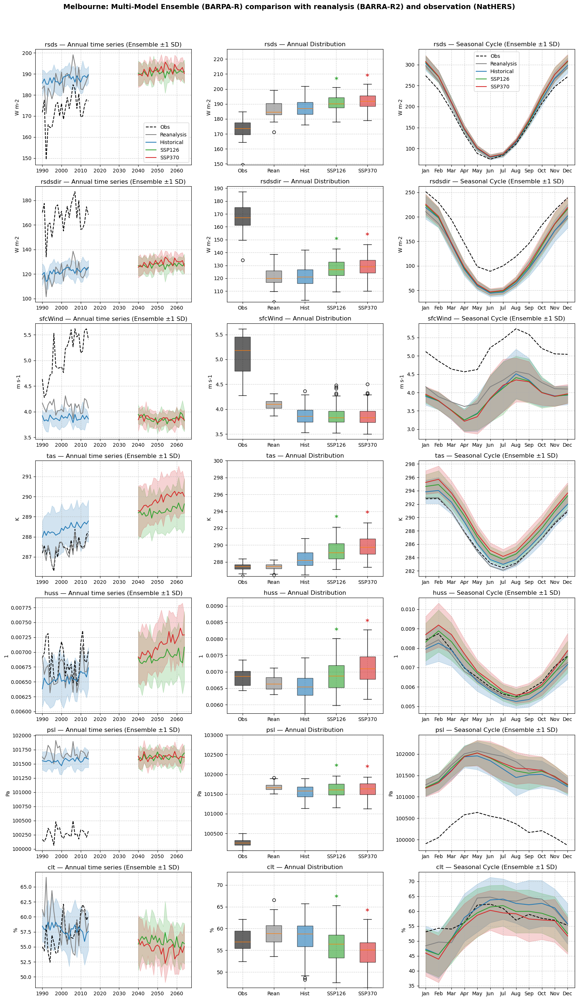



======================================= Darwin =======================================

=== Ensemble Mean Annual Changes ===
rsds (W m-2): Δ126=2.35 (1.0%)*, Δ370=-0.15 (-0.1%)
rsdsdir (W m-2): Δ126=4.54 (2.6%)*, Δ370=0.91 (0.5%)
sfcWind (m s-1): Δ126=-0.00 (-0.1%), Δ370=0.01 (0.3%)
tas (K): Δ126=1.19 (0.4%)*, Δ370=1.71 (0.6%)*
huss (kg/kg): Δ126=0.00 (6.4%)*, Δ370=0.00 (9.9%)*
psl (Pa): Δ126=42.54 (0.0%)*, Δ370=38.88 (0.0%)*
clt (%): Δ126=-1.74 (-4.1%)*, Δ370=-1.68 (-4.0%)*

=== Ensemble Mean Seasonal Changes ===

rsds (W m-2):
  DJF: Δ126=5.58 (2.4%)*, Δ370=2.63 (1.1%)
  MAM: Δ126=-0.27 (-0.1%), Δ370=-1.61 (-0.7%)
  JJA: Δ126=1.43 (0.6%), Δ370=-1.43 (-0.6%)
  SON: Δ126=2.64 (1.0%)*, Δ370=-0.17 (-0.1%)

rsdsdir (W m-2):
  DJF: Δ126=8.66 (6.0%)*, Δ370=4.88 (3.4%)*
  MAM: Δ126=0.74 (0.4%), Δ370=-1.01 (-0.6%)
  JJA: Δ126=3.51 (2.0%)*, Δ370=-0.97 (-0.5%)
  SON: Δ126=5.28 (2.6%)*, Δ370=0.74 (0.4%)

sfcWind (m s-1):
  DJF: Δ126=0.01 (0.3%), Δ370=0.06 (1.5%)
  MAM: Δ126=-0.01 (-0.4%), Δ370

/jobfs/152021720.gadi-pbs/ipykernel_3514280/511986898.py:227: UserWarning: Tight layout not applied. tight_layout cannot make Axes height small enough to accommodate all Axes decorations.
  plt.tight_layout(rect=[0,0,1,0.96])


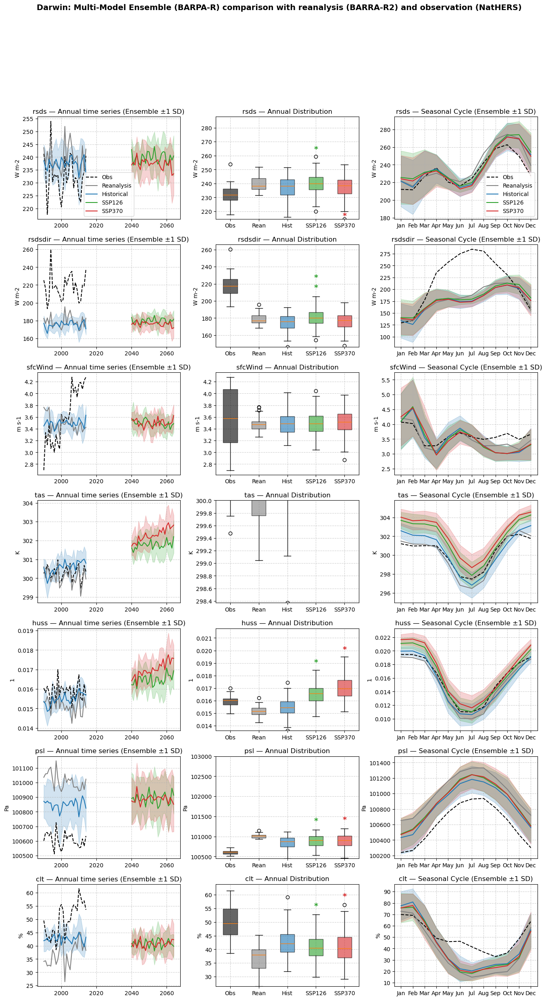



======================================= Cairns =======================================

=== Ensemble Mean Annual Changes ===
rsds (W m-2): Δ126=2.33 (0.9%)*, Δ370=0.12 (0.0%)
rsdsdir (W m-2): Δ126=4.01 (2.2%)*, Δ370=1.24 (0.7%)
sfcWind (m s-1): Δ126=0.02 (0.6%), Δ370=0.03 (1.0%)
tas (K): Δ126=1.06 (0.4%)*, Δ370=1.59 (0.5%)*
huss (kg/kg): Δ126=0.00 (6.2%)*, Δ370=0.00 (10.0%)*
psl (Pa): Δ126=51.39 (0.1%)*, Δ370=49.50 (0.0%)*
clt (%): Δ126=-0.79 (-1.7%), Δ370=0.02 (0.0%)

=== Ensemble Mean Seasonal Changes ===

rsds (W m-2):
  DJF: Δ126=4.36 (1.6%)*, Δ370=1.20 (0.4%)
  MAM: Δ126=2.06 (0.9%), Δ370=2.11 (0.9%)
  JJA: Δ126=1.29 (0.6%), Δ370=-1.14 (-0.6%)
  SON: Δ126=1.64 (0.6%), Δ370=-1.69 (-0.6%)

rsdsdir (W m-2):
  DJF: Δ126=6.46 (3.3%)*, Δ370=2.77 (1.4%)
  MAM: Δ126=2.84 (1.8%), Δ370=3.41 (2.1%)
  JJA: Δ126=2.90 (1.9%), Δ370=-0.48 (-0.3%)
  SON: Δ126=3.83 (1.7%)*, Δ370=-0.72 (-0.3%)

sfcWind (m s-1):
  DJF: Δ126=-0.01 (-0.6%), Δ370=0.00 (0.0%)
  MAM: Δ126=0.04 (1.4%), Δ370=-0.03 (-1.0%)

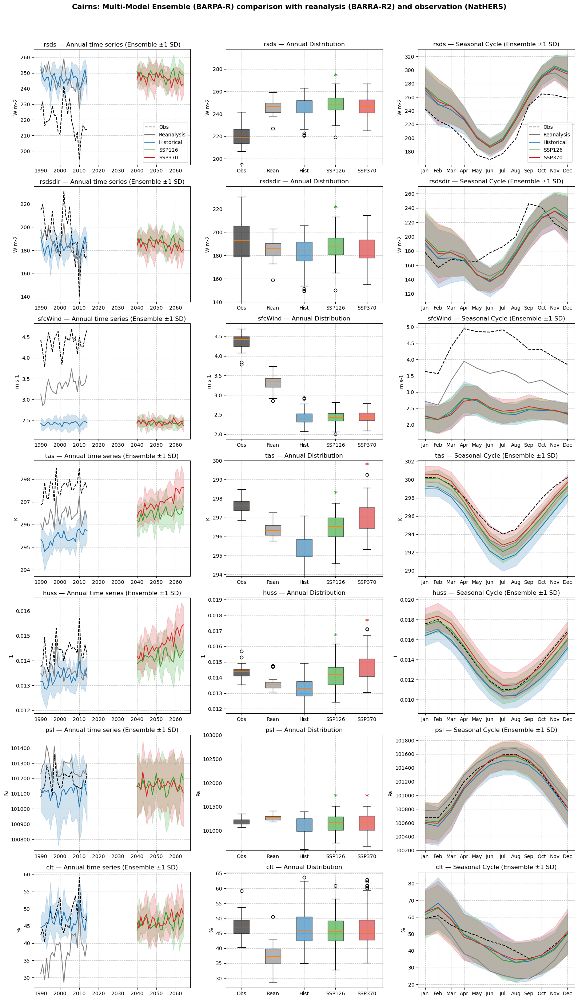



======================================= Brisbane =======================================

=== Ensemble Mean Annual Changes ===
rsds (W m-2): Δ126=1.80 (0.8%)*, Δ370=1.03 (0.5%)
rsdsdir (W m-2): Δ126=3.75 (2.3%)*, Δ370=2.82 (1.7%)*
sfcWind (m s-1): Δ126=-0.02 (-0.4%), Δ370=-0.02 (-0.6%)
tas (K): Δ126=1.12 (0.4%)*, Δ370=1.67 (0.6%)*
huss (kg/kg): Δ126=0.00 (7.7%)*, Δ370=0.00 (11.7%)*
psl (Pa): Δ126=52.69 (0.1%)*, Δ370=65.35 (0.1%)*
clt (%): Δ126=-1.75 (-4.7%)*, Δ370=-1.87 (-5.1%)*

=== Ensemble Mean Seasonal Changes ===

rsds (W m-2):
  DJF: Δ126=2.07 (0.7%), Δ370=1.46 (0.5%)
  MAM: Δ126=1.76 (0.9%), Δ370=0.95 (0.5%)
  JJA: Δ126=0.74 (0.5%), Δ370=0.04 (0.0%)
  SON: Δ126=2.62 (1.0%), Δ370=1.65 (0.6%)

rsdsdir (W m-2):
  DJF: Δ126=4.41 (2.1%)*, Δ370=3.74 (1.8%)*
  MAM: Δ126=3.65 (2.6%)*, Δ370=2.64 (1.9%)
  JJA: Δ126=1.76 (1.4%), Δ370=0.97 (0.8%)
  SON: Δ126=5.19 (2.7%)*, Δ370=3.92 (2.0%)*

sfcWind (m s-1):
  DJF: Δ126=-0.04 (-0.8%), Δ370=-0.00 (-0.1%)
  MAM: Δ126=-0.02 (-0.6%), Δ370=-0.0

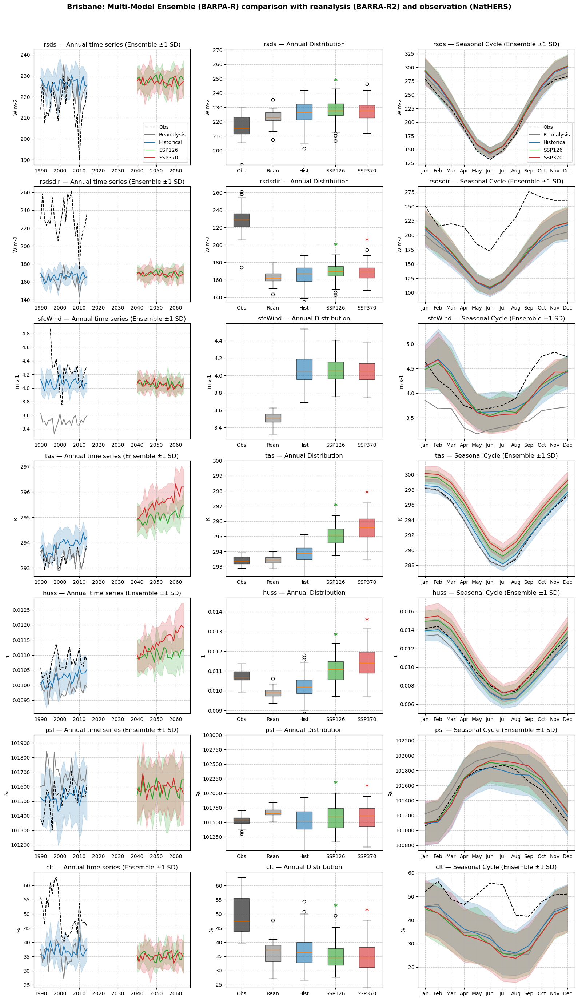



======================================= Longreach =======================================

=== Ensemble Mean Annual Changes ===
rsds (W m-2): Δ126=2.03 (0.8%)*, Δ370=0.60 (0.2%)
rsdsdir (W m-2): Δ126=4.55 (2.3%)*, Δ370=2.75 (1.4%)*
sfcWind (m s-1): Δ126=-0.00 (-0.1%), Δ370=0.02 (0.4%)
tas (K): Δ126=1.36 (0.5%)*, Δ370=2.09 (0.7%)*
huss (kg/kg): Δ126=0.00 (7.0%)*, Δ370=0.00 (11.7%)*
psl (Pa): Δ126=36.77 (0.0%), Δ370=30.49 (0.0%)
clt (%): Δ126=-2.40 (-9.0%)*, Δ370=-2.53 (-9.5%)*

=== Ensemble Mean Seasonal Changes ===

rsds (W m-2):
  DJF: Δ126=1.85 (0.6%), Δ370=1.16 (0.4%)
  MAM: Δ126=1.82 (0.8%), Δ370=0.15 (0.1%)
  JJA: Δ126=1.53 (0.8%), Δ370=0.47 (0.3%)
  SON: Δ126=2.92 (1.0%), Δ370=0.59 (0.2%)

rsdsdir (W m-2):
  DJF: Δ126=4.76 (2.0%)*, Δ370=3.96 (1.7%)*
  MAM: Δ126=3.91 (2.2%)*, Δ370=2.17 (1.2%)
  JJA: Δ126=3.29 (2.2%)*, Δ370=1.90 (1.3%)
  SON: Δ126=6.24 (2.8%)*, Δ370=2.97 (1.3%)

sfcWind (m s-1):
  DJF: Δ126=-0.03 (-0.6%), Δ370=0.02 (0.3%)
  MAM: Δ126=-0.04 (-1.0%), Δ370=-0.07 (-1

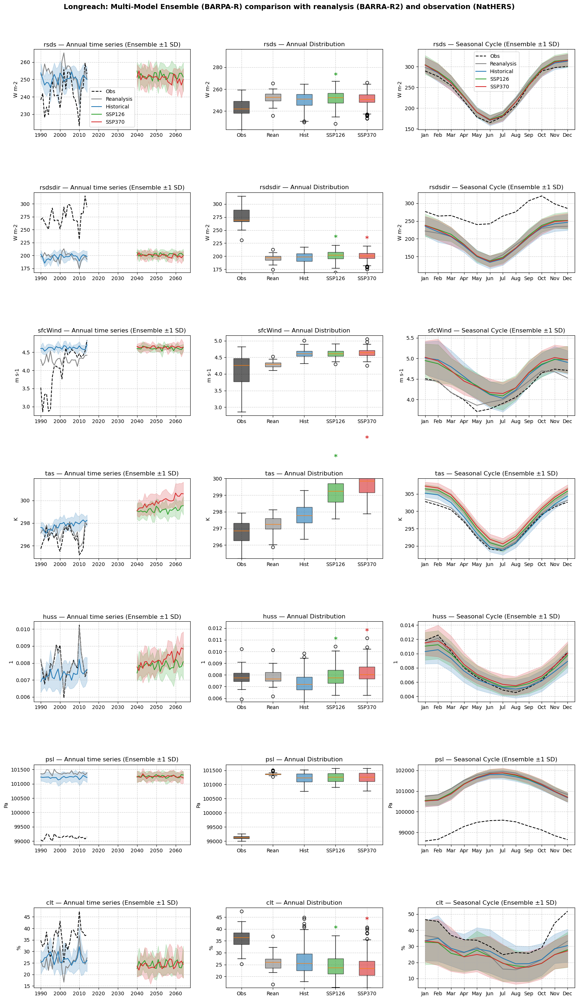



======================================= Mildura =======================================

=== Ensemble Mean Annual Changes ===
rsds (W m-2): Δ126=3.30 (1.5%)*, Δ370=3.67 (1.7%)*
rsdsdir (W m-2): Δ126=6.15 (3.7%)*, Δ370=7.40 (4.5%)*
sfcWind (m s-1): Δ126=-0.01 (-0.3%), Δ370=-0.04 (-0.9%)*
tas (K): Δ126=1.01 (0.3%)*, Δ370=1.60 (0.5%)*
huss (kg/kg): Δ126=0.00 (4.7%)*, Δ370=0.00 (7.8%)*
psl (Pa): Δ126=51.30 (0.1%)*, Δ370=51.87 (0.1%)*
clt (%): Δ126=-2.64 (-6.4%)*, Δ370=-4.24 (-10.3%)*

=== Ensemble Mean Seasonal Changes ===

rsds (W m-2):
  DJF: Δ126=2.71 (0.8%)*, Δ370=2.43 (0.7%)
  MAM: Δ126=2.02 (1.1%), Δ370=1.96 (1.1%)
  JJA: Δ126=2.41 (2.1%)*, Δ370=3.40 (2.9%)*
  SON: Δ126=6.05 (2.4%), Δ370=6.89 (2.7%)*

rsdsdir (W m-2):
  DJF: Δ126=5.87 (2.2%)*, Δ370=6.50 (2.5%)*
  MAM: Δ126=4.10 (2.9%), Δ370=4.56 (3.3%)
  JJA: Δ126=3.85 (5.4%)*, Δ370=5.72 (8.0%)*
  SON: Δ126=10.77 (5.9%)*, Δ370=12.83 (7.0%)*

sfcWind (m s-1):
  DJF: Δ126=-0.01 (-0.1%), Δ370=0.01 (0.1%)
  MAM: Δ126=0.02 (0.6%), Δ370=

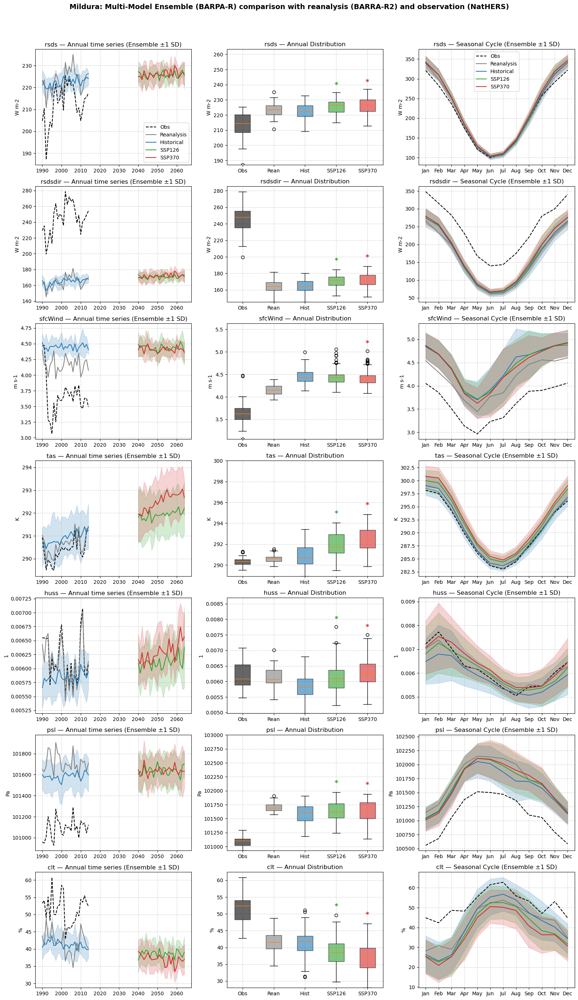



======================================= Adelaide =======================================

=== Ensemble Mean Annual Changes ===
rsds (W m-2): Δ126=3.53 (1.7%)*, Δ370=4.22 (2.0%)*
rsdsdir (W m-2): Δ126=5.97 (3.9%)*, Δ370=7.46 (4.9%)*
sfcWind (m s-1): Δ126=-0.04 (-1.0%)*, Δ370=-0.07 (-1.7%)*
tas (K): Δ126=0.87 (0.3%)*, Δ370=1.39 (0.5%)*
huss (kg/kg): Δ126=0.00 (4.9%)*, Δ370=0.00 (7.5%)*
psl (Pa): Δ126=59.68 (0.1%)*, Δ370=62.24 (0.1%)*
clt (%): Δ126=-2.25 (-4.8%)*, Δ370=-3.67 (-7.9%)*

=== Ensemble Mean Seasonal Changes ===

rsds (W m-2):
  DJF: Δ126=2.92 (0.9%)*, Δ370=4.03 (1.2%)*
  MAM: Δ126=2.33 (1.3%), Δ370=2.86 (1.6%)
  JJA: Δ126=2.33 (2.3%)*, Δ370=3.19 (3.1%)*
  SON: Δ126=6.53 (2.7%)*, Δ370=6.79 (2.8%)*

rsdsdir (W m-2):
  DJF: Δ126=6.25 (2.4%)*, Δ370=8.78 (3.4%)*
  MAM: Δ126=3.72 (3.0%), Δ370=4.93 (3.9%)
  JJA: Δ126=3.50 (5.8%)*, Δ370=4.57 (7.6%)*
  SON: Δ126=10.42 (6.2%)*, Δ370=11.53 (6.9%)*

sfcWind (m s-1):
  DJF: Δ126=-0.02 (-0.5%), Δ370=-0.01 (-0.2%)
  MAM: Δ126=-0.03 (-0.7%)

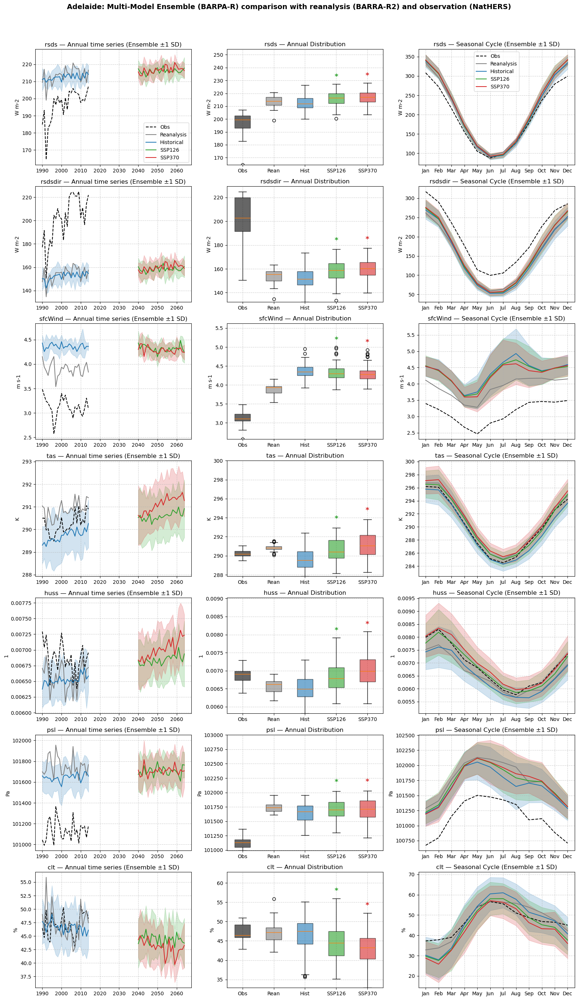



======================================= Perth =======================================

=== Ensemble Mean Annual Changes ===
rsds (W m-2): Δ126=3.87 (1.7%)*, Δ370=4.69 (2.0%)*
rsdsdir (W m-2): Δ126=6.57 (3.8%)*, Δ370=8.38 (4.8%)*
sfcWind (m s-1): Δ126=-0.02 (-0.4%), Δ370=-0.00 (-0.1%)
tas (K): Δ126=1.02 (0.4%)*, Δ370=1.55 (0.5%)*
huss (kg/kg): Δ126=0.00 (4.9%)*, Δ370=0.00 (7.3%)*
psl (Pa): Δ126=53.37 (0.1%)*, Δ370=42.75 (0.0%)*
clt (%): Δ126=-3.12 (-8.2%)*, Δ370=-4.74 (-12.5%)*

=== Ensemble Mean Seasonal Changes ===

rsds (W m-2):
  DJF: Δ126=2.80 (0.8%)*, Δ370=2.66 (0.8%)
  MAM: Δ126=1.65 (0.9%), Δ370=1.94 (1.0%)
  JJA: Δ126=4.99 (4.1%)*, Δ370=6.32 (5.2%)*
  SON: Δ126=6.02 (2.3%), Δ370=7.85 (3.0%)*

rsdsdir (W m-2):
  DJF: Δ126=5.83 (2.1%)*, Δ370=6.80 (2.4%)*
  MAM: Δ126=3.32 (2.3%), Δ370=4.22 (2.9%)
  JJA: Δ126=6.77 (8.8%)*, Δ370=8.57 (11.2%)*
  SON: Δ126=10.36 (5.3%)*, Δ370=13.94 (7.1%)*

sfcWind (m s-1):
  DJF: Δ126=0.03 (0.5%), Δ370=0.04 (0.7%)*
  MAM: Δ126=-0.02 (-0.5%), Δ370=0

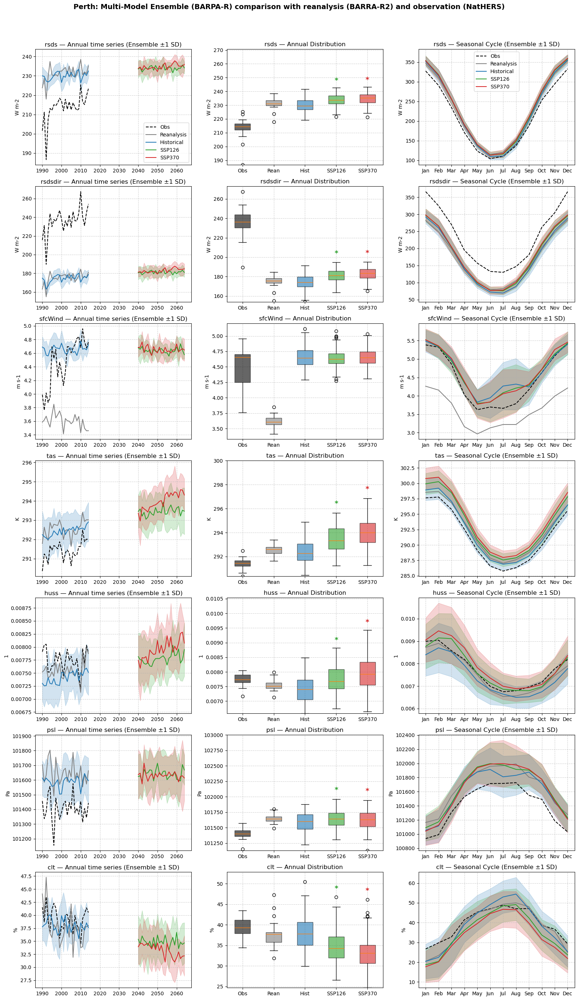



======================================= Sydney =======================================

=== Ensemble Mean Annual Changes ===
rsds (W m-2): Δ126=1.36 (0.7%), Δ370=0.38 (0.2%)
rsdsdir (W m-2): Δ126=2.88 (2.0%)*, Δ370=1.97 (1.4%)*
sfcWind (m s-1): Δ126=-0.01 (-0.3%), Δ370=-0.03 (-0.9%)*
tas (K): Δ126=1.13 (0.4%)*, Δ370=1.70 (0.6%)*
huss (kg/kg): Δ126=0.00 (7.5%)*, Δ370=0.00 (11.5%)*
psl (Pa): Δ126=49.92 (0.0%)*, Δ370=63.78 (0.1%)*
clt (%): Δ126=-1.37 (-3.0%)*, Δ370=-1.98 (-4.4%)*

=== Ensemble Mean Seasonal Changes ===

rsds (W m-2):
  DJF: Δ126=1.98 (0.7%), Δ370=-1.75 (-0.6%)
  MAM: Δ126=-0.61 (-0.3%), Δ370=-1.63 (-0.9%)
  JJA: Δ126=1.97 (1.5%), Δ370=2.25 (1.7%)
  SON: Δ126=2.08 (0.9%), Δ370=2.63 (1.1%)

rsdsdir (W m-2):
  DJF: Δ126=4.20 (2.2%)*, Δ370=-0.30 (-0.2%)
  MAM: Δ126=-0.15 (-0.1%), Δ370=-1.19 (-1.0%)
  JJA: Δ126=3.27 (3.5%)*, Δ370=3.99 (4.2%)*
  SON: Δ126=4.22 (2.5%)*, Δ370=5.36 (3.2%)*

sfcWind (m s-1):
  DJF: Δ126=0.01 (0.2%), Δ370=0.03 (0.7%)
  MAM: Δ126=-0.02 (-0.7%), Δ37

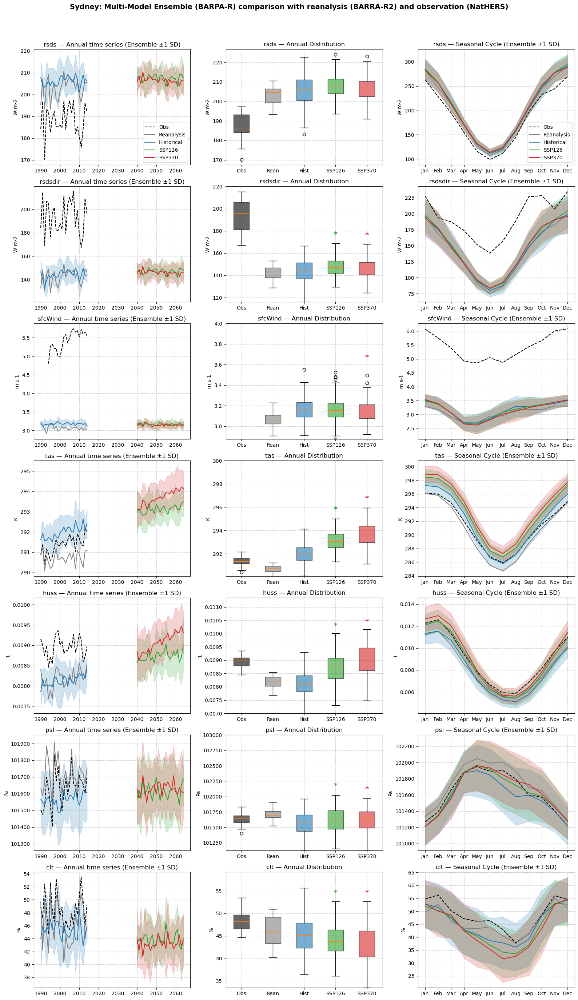



======================================= Canberra =======================================

=== Ensemble Mean Annual Changes ===
rsds (W m-2): Δ126=3.47 (1.6%)*, Δ370=2.82 (1.3%)*
rsdsdir (W m-2): Δ126=6.01 (3.9%)*, Δ370=5.66 (3.7%)*
sfcWind (m s-1): Δ126=-0.01 (-0.4%), Δ370=-0.04 (-1.1%)
tas (K): Δ126=1.16 (0.4%)*, Δ370=1.59 (0.6%)*
huss (kg/kg): Δ126=0.00 (6.6%)*, Δ370=0.00 (9.4%)*
psl (Pa): Δ126=47.04 (0.0%)*, Δ370=68.58 (0.1%)*
clt (%): Δ126=-2.48 (-5.1%)*, Δ370=-3.46 (-7.1%)*

=== Ensemble Mean Seasonal Changes ===

rsds (W m-2):
  DJF: Δ126=4.05 (1.3%)*, Δ370=1.48 (0.5%)
  MAM: Δ126=0.95 (0.5%), Δ370=0.19 (0.1%)
  JJA: Δ126=3.18 (2.8%)*, Δ370=3.74 (3.2%)*
  SON: Δ126=5.68 (2.3%)*, Δ370=5.87 (2.4%)*

rsdsdir (W m-2):
  DJF: Δ126=7.69 (3.4%)*, Δ370=4.38 (1.9%)*
  MAM: Δ126=2.19 (1.7%), Δ370=1.57 (1.2%)
  JJA: Δ126=4.69 (6.3%)*, Δ370=6.05 (8.2%)*
  SON: Δ126=9.45 (5.4%)*, Δ370=10.63 (6.1%)*

sfcWind (m s-1):
  DJF: Δ126=0.00 (0.1%), Δ370=-0.02 (-0.7%)
  MAM: Δ126=-0.02 (-0.7%), Δ370

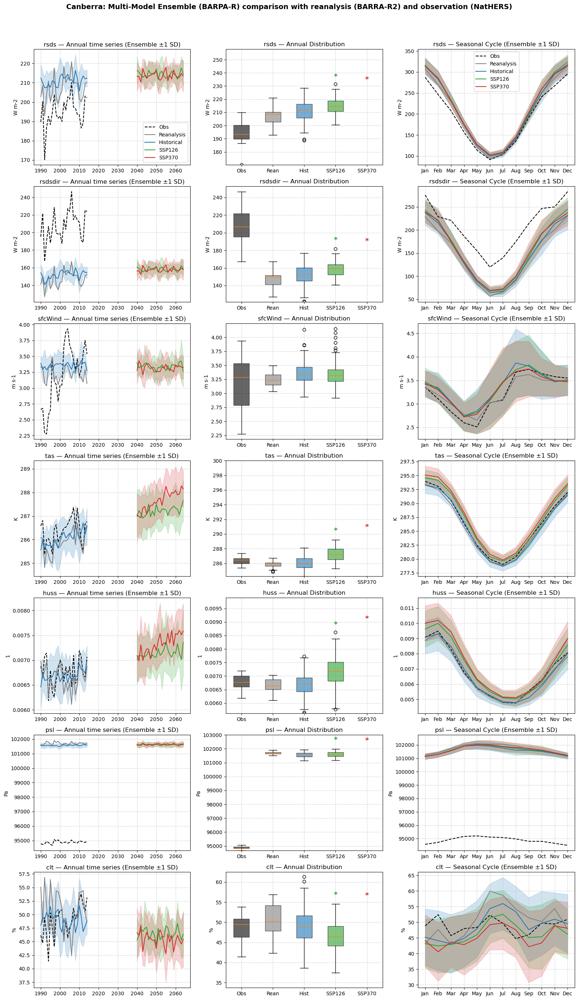



======================================= Hobart =======================================

=== Ensemble Mean Annual Changes ===
rsds (W m-2): Δ126=3.29 (1.9%)*, Δ370=4.18 (2.5%)*
rsdsdir (W m-2): Δ126=5.61 (5.6%)*, Δ370=7.51 (7.5%)*
sfcWind (m s-1): Δ126=0.05 (1.7%), Δ370=0.05 (1.7%)
tas (K): Δ126=0.91 (0.3%)*, Δ370=1.41 (0.5%)*
huss (kg/kg): Δ126=0.00 (5.4%)*, Δ370=0.00 (8.5%)*
psl (Pa): Δ126=50.29 (0.0%)*, Δ370=71.36 (0.1%)*
clt (%): Δ126=-2.20 (-3.1%)*, Δ370=-3.57 (-5.0%)*

=== Ensemble Mean Seasonal Changes ===

rsds (W m-2):
  DJF: Δ126=5.05 (1.9%)*, Δ370=6.61 (2.4%)*
  MAM: Δ126=1.70 (1.3%), Δ370=2.05 (1.6%)
  JJA: Δ126=1.18 (1.5%), Δ370=1.02 (1.3%)
  SON: Δ126=5.23 (2.6%), Δ370=7.03 (3.5%)*

rsdsdir (W m-2):
  DJF: Δ126=8.77 (5.2%)*, Δ370=11.77 (7.0%)*
  MAM: Δ126=3.17 (4.1%), Δ370=4.40 (5.7%)*
  JJA: Δ126=2.31 (5.7%)*, Δ370=2.38 (5.9%)*
  SON: Δ126=8.21 (7.2%)*, Δ370=11.50 (10.1%)*

sfcWind (m s-1):
  DJF: Δ126=0.05 (1.7%), Δ370=-0.03 (-1.2%)
  MAM: Δ126=-0.02 (-0.7%), Δ370=-0.0

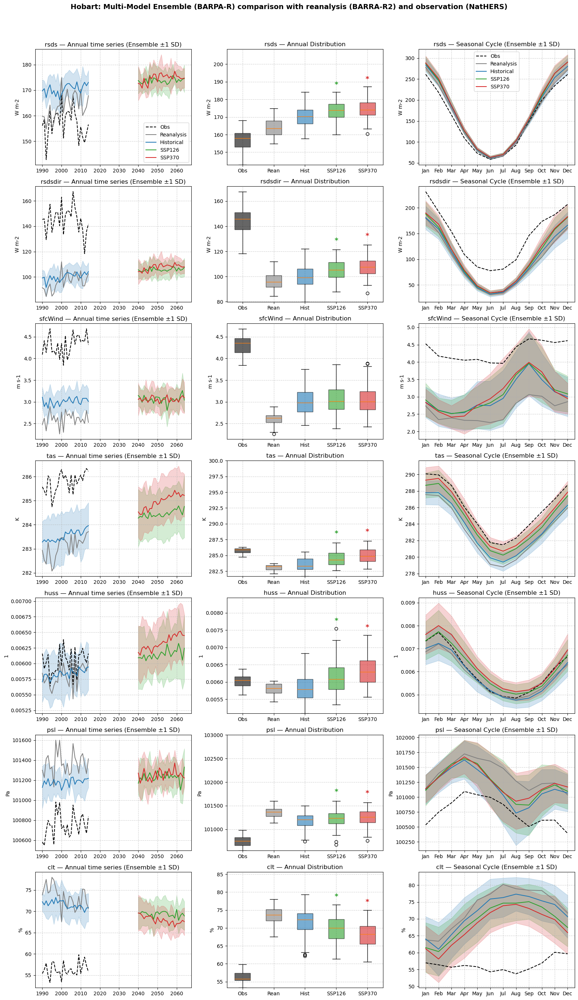

In [3]:
# --- Settings ---
models = ["ACCESS-ESM1-5", "ACCESS-CM2", "CESM2", "CMCC-ESM2","NorESM2-MM", "EC-Earth3", "MPI-ESM1-2-HR"]
vars_to_check = ["rsds", "rsdsdir", "sfcWind","tas","huss","psl","clt"]
dataset_colors = {"Obs": "black", "Rean": "gray",
                  "Hist": "tab:blue", "SSP126": "tab:green", "SSP370": "tab:red"}
alpha = 0.05

# --- Loop through cities ---
for city in cities:
    # --- Load single obs/reanalysis reference ---
    obs = xr.open_dataset(glob.glob(f"{root_dir}NatHERS/raw_data/{city}_*_NatHERS_1990-2015.nc")[0]).sel(time=slice("1990","2014"))
    rean = xr.open_dataset(f"{root_dir}step1_raw_data_extraction/BARRA-R2/{city}_AUS-11_ERA5_historical_hres_BOM_BARRA-R2_v1_1hr_1985-2014.nc").sel(time=slice("1990","2014"))
    
    # --- Helper: unify calendars and compute monthly means ---
    def monthly_means_unified_calendar(ds):
        ds = xr.decode_cf(ds)
        if hasattr(ds.time.dt, "calendar"):
            ds = ds.convert_calendar("standard", use_cftime=False)
        ds_monthly = ds.resample(time="1ME").mean()
        ds_monthly = ds_monthly.assign_coords(
            month=("time", ds_monthly["time"].dt.month.data),
            year=("time", ds_monthly["time"].dt.year.data)
        )
        return ds_monthly
    
    # --- Load ensembles ---
    def load_ensemble(period, ssp=None):
        files = []
        for m in models:
            if ssp is None:
                path = f"{root_dir}step1_raw_data_extraction/BARPA-R/1985_2014/{city}_AUS-15_{m}_historical_*_BOM_BARPA-R_v1-r1_1hr_1985-2014.nc"
            else:
                path = f"{root_dir}step1_raw_data_extraction/BARPA-R/2035_2064/{city}_AUS-15_{m}_{ssp}_*_BOM_BARPA-R_v1-r1_1hr_2035-2064.nc"
            ds = xr.open_dataset(glob.glob(path)[0]).sel(time=slice(*period))
            ds_mon = monthly_means_unified_calendar(ds)
            files.append(ds_mon[vars_to_check])
        return xr.concat(files, dim="model").assign_coords(model=models)
    
    # --- Load historical and future SSP ensembles ---
    hist = load_ensemble(("1990","2014"))
    ssp126 = load_ensemble(("2040-01-01","2064-12-30"), "ssp126")
    ssp370 = load_ensemble(("2040-01-01","2064-12-30"), "ssp370")
    
    # --- Daily → Annual means ---
    def to_annual(ds): return ds.resample(time="YE").mean()
    obs_annual, rean_annual = to_annual(obs), to_annual(rean)
    hist_annual, ssp126_annual, ssp370_annual = to_annual(hist), to_annual(ssp126), to_annual(ssp370)
    
    # --- Ensemble mean and std ---
    hist_mean = hist_annual.mean("model")
    ssp126_mean = ssp126_annual.mean("model")
    ssp370_mean = ssp370_annual.mean("model")
    hist_std = hist_annual.std("model")
    ssp126_std = ssp126_annual.std("model")
    ssp370_std = ssp370_annual.std("model")
    
    # --- Ensemble statistics (Δ vs historical) ---
    def ensemble_change(fut, hist):
        delta = fut.mean(("time","model")) - hist.mean(("time","model"))
        rel = 100 * delta / hist.mean(("time","model"))
        return delta, rel
    
    delta_126, rel_126 = ensemble_change(ssp126_annual, hist_annual)
    delta_370, rel_370 = ensemble_change(ssp370_annual, hist_annual)
    
    print(f"\n======================================================================================")
    print(f"\n======================================= {city} =======================================")
    print("\n=== Ensemble Mean Annual Changes ===")
    for var in vars_to_check:
        f126 = ssp126_annual[var].values.flatten()
        f370 = ssp370_annual[var].values.flatten()
        h = hist_annual[var].values.flatten()
        _, p126 = ttest_ind(f126, h, equal_var=False, nan_policy="omit")
        _, p370 = ttest_ind(f370, h, equal_var=False, nan_policy="omit")
        star126 = "*" if p126 < alpha else ""
        star370 = "*" if p370 < alpha else ""
        print(f"{var} ({'kg/kg' if obs[var].units == '1' else obs[var].units}): Δ126={float(delta_126[var]):.2f} ({float(rel_126[var]):.1f}%){star126}, "
              f"Δ370={float(delta_370[var]):.2f} ({float(rel_370[var]):.1f}%){star370}")
    
    # --- Seasonal ensemble statistics (Δ vs historical) ---
    def seasonal_ensemble_change(fut, hist):
        """Compute absolute and relative ensemble-mean seasonal changes."""
        fut_season = fut.groupby("time.season").mean(["time", "model"])
        hist_season = hist.groupby("time.season").mean(["time", "model"])
        delta = fut_season - hist_season
        rel = 100 * delta / hist_season
        return delta, rel
    
    delta_126_seas, rel_126_seas = seasonal_ensemble_change(ssp126, hist)
    delta_370_seas, rel_370_seas = seasonal_ensemble_change(ssp370, hist)
    
    print("\n=== Ensemble Mean Seasonal Changes ===")
    for var in vars_to_check:
        print(f"\n{var} ({'kg/kg' if obs[var].units == '1' else obs[var].units}):")
        available_seasons = delta_126_seas[var]["season"].values if "season" in delta_126_seas[var].coords else []
        for season in ["DJF", "MAM", "JJA", "SON"]:
            if season not in available_seasons:
                print(f"  {season}: (no data)")
                continue
    
            # Flatten and drop NaNs for significance test
            f126 = ssp126[var].where(ssp126["time"].dt.season == season, drop=True).values.flatten()
            f370 = ssp370[var].where(ssp370["time"].dt.season == season, drop=True).values.flatten()
            h = hist[var].where(hist["time"].dt.season == season, drop=True).values.flatten()
    
            _, p126 = ttest_ind(f126, h, equal_var=False, nan_policy="omit")
            _, p370 = ttest_ind(f370, h, equal_var=False, nan_policy="omit")
    
            star126 = "*" if p126 < alpha else ""
            star370 = "*" if p370 < alpha else ""
    
            d126 = float(delta_126_seas[var].sel(season=season, drop=True))
            r126 = float(rel_126_seas[var].sel(season=season, drop=True))
            d370 = float(delta_370_seas[var].sel(season=season, drop=True))
            r370 = float(rel_370_seas[var].sel(season=season, drop=True))
    
            print(f"  {season}: Δ126={d126:.2f} ({r126:.1f}%){star126}, "
                  f"Δ370={d370:.2f} ({r370:.1f}%){star370}")
    
    
    ## --- Plotting: Annual trends, Annual boxplots, Seasonal cycles ---
    fig, axes = plt.subplots(len(vars_to_check), 3, figsize=(16, 4 * len(vars_to_check)), squeeze=False)
    
    for i, var in enumerate(vars_to_check):
        # (1) Annual time series with ensemble shading
        ax = axes[i, 0]
        ax.plot(obs_annual["time"].dt.year, obs_annual[var], color="black", linestyle="--", label="Obs")
        ax.plot(rean_annual["time"].dt.year, rean_annual[var], color="gray", label="Reanalysis")
    
        yrs_hist = hist_annual["time"].dt.year
        hist_mean_ts = hist_annual[var].mean("model")
        hist_std_ts = hist_annual[var].std("model")
        ax.plot(yrs_hist, hist_mean_ts, color="tab:blue", label="Historical")
        ax.fill_between(yrs_hist, hist_mean_ts - hist_std_ts, hist_mean_ts + hist_std_ts, color="tab:blue", alpha=0.2)
    
        for ssp_mean, ssp_std, col, lbl in [(ssp126_mean, ssp126_std, "tab:green", "SSP126"),
                                           (ssp370_mean, ssp370_std, "tab:red", "SSP370")]:
            yrs = ssp_mean["time"].dt.year
            ax.plot(yrs, ssp_mean[var], color=col, label=lbl)
            ax.fill_between(yrs, ssp_mean[var] - ssp_std[var], ssp_mean[var] + ssp_std[var], color=col, alpha=0.2)
    
        ax.set_title(f"{var} — Annual time series (Ensemble ±1 SD)")
        ax.set_ylabel(obs[var].units)#"W/m²" if "rsds" in var else "m/s")
        ax.grid(True, ls="--", alpha=0.6)
        if i == 0:
            ax.legend()
    
        # (2) Annual boxplot
        axb = axes[i, 1]
        box_data = [
            obs_annual[var].values.flatten(),
            rean_annual[var].values.flatten(),
            hist_annual[var].values.flatten(),
            ssp126_annual[var].values.flatten(),
            ssp370_annual[var].values.flatten()
        ]
    
        labels = ["Obs", "Rean", "Hist", "SSP126", "SSP370"]
        boxes = axb.boxplot(box_data, tick_labels=labels, patch_artist=True)
    
        # Color boxes
        for patch, lab in zip(boxes['boxes'], labels):
            patch.set_facecolor(dataset_colors[lab])
            patch.set_alpha(0.6)
    
        # significance asterisks (kept within plot bounds)
        idx_map = {"SSP126": 3, "SSP370": 4}

        if var in ["psl","tas"]:
            y_max = 103000 if var == "psl" else 300
        else:
            y_max = np.nanmax([np.nanmax(d) for d in box_data if np.isfinite(np.nanmax(d))])
        
        y_min = np.nanmin([np.nanmin(d) for d in box_data if np.isfinite(np.nanmin(d))])
    
        for ds in ["SSP126", "SSP370"]:
            arr = box_data[idx_map[ds]]
            arr_f = arr[~np.isnan(arr)]
            hist_f = box_data[2][~np.isnan(box_data[2])]
            if arr_f.size < 2 or hist_f.size < 2:
                continue
            _, p = ttest_ind(arr_f, hist_f, equal_var=False, nan_policy="omit")
            if p < alpha:
                pos = idx_map[ds] + 1  # boxplot positions are 1-based
                whisker_top = np.nanmax(arr_f)
                y_offset = (y_max - y_min) * 0.05
                y_ast = whisker_top + y_offset
                # Ensure within current y-limits
                axb.set_ylim(y_min, max(y_max if var in ["psl","tas"] else axb.get_ylim()[1], y_max if var in ["psl","tas"] else y_ast * 1.1))
                axb.text(pos, y_ast, "*", color=dataset_colors[ds],
                         ha="center", va="bottom", fontsize=14, fontweight="bold")
    
        axb.set_title(f"{var} — Annual Distribution")
        axb.set_ylabel(obs[var].units)#"W/m²" if "rsds" in var else "m/s")
        axb.grid(True, ls="--", alpha=0.6)
    
        # (3) Seasonal cycle (monthly climatology) with ensemble spread
        axs = axes[i, 2]
        months = np.arange(1, 13)
        obs_clim = obs[var].groupby("time.month").mean("time")
        rean_clim = rean[var].groupby("time.month").mean("time")
        axs.plot(months, obs_clim, "--", color="black", label="Obs")
        axs.plot(months, rean_clim, color="gray", label="Reanalysis")
    
        hist_clim = hist[var].groupby("time.month").mean(["time", "model"])
        hist_std = hist[var].groupby("time.month").std(["time", "model"])
        axs.plot(months, hist_clim, color="tab:blue", label="Historical")
        axs.fill_between(months, hist_clim - hist_std, hist_clim + hist_std, color="tab:blue", alpha=0.2)
    
        for ssp_ds, col, lbl in [(ssp126, "tab:green", "SSP126"), (ssp370, "tab:red", "SSP370")]:
            clim = ssp_ds[var].groupby("time.month").mean(["time", "model"])
            std = ssp_ds[var].groupby("time.month").std(["time", "model"])
            axs.plot(months, clim, color=col, label=lbl)
            axs.fill_between(months, clim - std, clim + std, color=col, alpha=0.2)
    
        axs.set_xticks(months)
        axs.set_xticklabels(["Jan","Feb","Mar","Apr","May","Jun","Jul","Aug","Sep","Oct","Nov","Dec"])
        axs.set_title(f"{var} — Seasonal Cycle (Ensemble ±1 SD)")
        axs.set_ylabel(obs[var].units)#"W/m²" if "rsds" in var else "m/s")
        axs.grid(True, ls="--", alpha=0.6)
        if i == 0:
            axs.legend()
    
    plt.suptitle(f"{city}: Multi-Model Ensemble (BARPA-R) comparison with reanalysis (BARRA-R2) and observation (NatHERS)",
                 fontsize=14, fontweight="bold")
    plt.subplots_adjust(hspace=0.25, wspace=0.25)
    plt.tight_layout(rect=[0,0,1,0.96])
    plt.savefig(f"{root_dir}plots/{city}_MME_BARRA-R2_NatHERS_comp_and_future_changes_2040-2064.pdf",dpi=300)
    plt.show()
